# Description of modeling


* First consider different data input: only original 4 vars; add location and/ or season vars (date and hour will lead to overfitting); other scalers (robustscaler). 
    * Use the same model to compare all the data inputs, and choose the one that doesn't lead to overfitting: the orginal 4 vars.
* Then use random strategy to find the optimal parameters. Parameters considered included:
    * layers of GRU
    * learning rate
    * learning rate decay
    * regularization within a layer
    * optimizer
    * clipnorm
    * dropout rate
    * layer units and decay rate

* Use MAE/ R2 (they yield the same result) to get the optimal model
* Fine tune the final model by adjusting the optimizer, learning_rate, batch_size, epoch, units of GRU

**Note: shuffle has always been set as False**
* There are so many hyperparameters that can be tuned and it is really hard to determine the tradeoff between bias and variance. I did my best but can only reach as high as 0.84 of R2 on test set. There seems to be some dramatic difference among training, validate, and testing datasets.

# Coding

In [312]:
# Run this cell to configure Tensorflow to use your GPU
import tensorflow as tf
    
# tf.config.experimental.set_visible_devices([], 'GPU')
# tf.debugging.set_log_device_placement(True)
for gpu in tf.config.experimental.list_physical_devices('GPU'):
    print(gpu)
    tf.config.experimental.set_memory_growth(gpu, True)

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [313]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_format = 'retina'
sns.set_context('talk')

## Read data

In [314]:
%%capture
prefix = 'https://danylo-ucla.s3-us-west-2.amazonaws.com/app/storage/weather/jobs/transform_batch/20220925-014051_e32aa567fa482e970513332d1d24fd51'

train_X = pd.read_parquet(f'{prefix}/train_x.parquet')
train_y = pd.read_parquet(f'{prefix}/train_y.parquet')

validate_X = pd.read_parquet(f'{prefix}/validate_x.parquet')
validate_y = pd.read_parquet(f'{prefix}/validate_y.parquet')

test_X = pd.read_parquet(f'{prefix}/test_x.parquet')
test_y = pd.read_parquet(f'{prefix}/test_y.parquet')

score_X = pd.read_parquet(f'{prefix}/score_x.parquet')

condition_window = 24
prediction_window = 24
features_length = 4

In [315]:
train_X.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 826464 entries, ('Albuquerque/1108/0', Timestamp('2015-02-16 09:00:00')) to ('Vancouver/806/12', Timestamp('2014-07-03 04:00:00'))
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   temperature  826464 non-null  float64
 1   humidity     826464 non-null  float64
 2   pressure     826464 non-null  float64
 3   wind_speed   826464 non-null  float64
dtypes: float64(4)
memory usage: 31.9+ MB


In [316]:
score_X.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 57576 entries, ('Albuquerque/2249/0', Timestamp('2017-07-15 13:00:00')) to ('Vancouver/2623/10', Timestamp('2017-07-07 20:00:00'))
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   temperature  57576 non-null  float64
 1   humidity     57576 non-null  float64
 2   pressure     57576 non-null  float64
 3   wind_speed   57576 non-null  float64
dtypes: float64(4)
memory usage: 2.1+ MB


In [317]:
train_X.groupby('sample').size().head()

sample
Albuquerque/1108/0    24
Albuquerque/1108/1    24
Albuquerque/1108/2    24
Albuquerque/1112/0    24
Albuquerque/1112/1    24
dtype: int64

In [318]:
train_X

temperature  humidity  pressure  \
sample             time                                                   
Albuquerque/1108/0 2015-02-16 09:00:00   276.323000      47.0    1031.0   
                   2015-02-16 10:00:00   275.097667      45.0    1032.0   
                   2015-02-16 11:00:00   273.931333      48.0    1032.0   
                   2015-02-16 12:00:00   274.380000      46.0    1033.0   
                   2015-02-16 13:00:00   272.675333      51.0    1033.0   
...                                             ...       ...       ...   
Vancouver/806/12   2014-07-03 00:00:00   296.870000      41.0    1009.0   
                   2014-07-03 01:00:00   296.110000      53.0    1013.0   
                   2014-07-03 02:00:00   297.330000      53.0    1013.0   
                   2014-07-03 03:00:00   295.440000      53.0    1013.0   
                   2014-07-03 04:00:00   294.150000      60.0    1013.0   

                                        wind_speed  
sample             time                             
Albuquerque/1108/0 2015-02-16 09:00:00         3.0  
                   2015-02-16 10:00:00         3.0  
                   2015-02-16 11:00:00         2.0  
                   2015-02-16 12:00:00         2.0  
                   2015-02-16 13:00:00         1.0  
...                                            ...  
Vancouver/806/12   2014-07-03 00:00:00        10.0  
                   2014-07-03 01:00:00         7.0  
                   2014-07-03 02:00:00         7.0  
                   2014-07-03 03:00:00         7.0  
                   2014-07-03 04:00:00         6.0  

[826464 rows x 4 columns]

In [319]:
train_X.loc['Albuquerque/1112/1'].head(24)

,temperature,humidity,pressure,wind_speed
time,,,,
2015-02-20 18:00:00,282.116500,46.0,1023.0,3.0
2015-02-20 19:00:00,287.061667,40.0,1021.0,4.0
2015-02-20 20:00:00,288.236333,38.0,1019.0,4.0
2015-02-20 21:00:00,286.928000,35.0,1020.0,4.0
2015-02-20 22:00:00,288.930333,34.0,1017.0,5.0
2015-02-20 23:00:00,288.449667,31.0,1017.0,5.0
2015-02-21 00:00:00,286.976000,30.0,1019.0,4.0
2015-02-21 01:00:00,286.826333,27.0,1018.0,5.0
2015-02-21 02:00:00,285.683667,26.0,1019.0,5.0


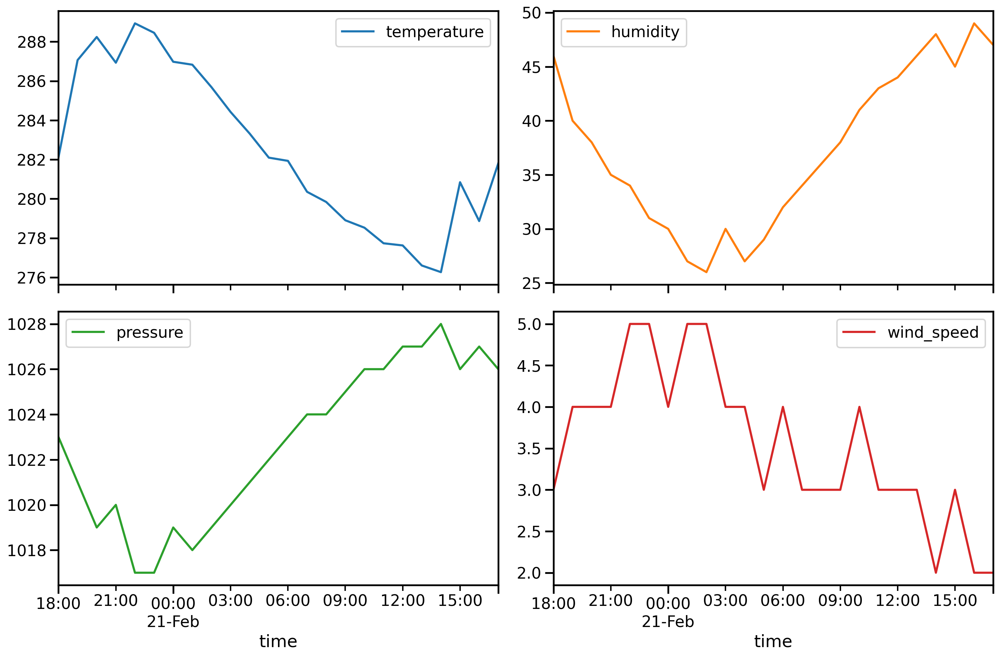

In [320]:
train_X.loc['Albuquerque/1112/1'].plot(subplots=True, layout=(2, 2), figsize=[15, 10])
plt.tight_layout()

In [321]:
train_y.loc['Albuquerque/1112/1'].head(24)

,temperature,humidity,pressure,wind_speed
time,,,,
2015-02-21 18:00:00,282.091500,44.0,1024.0,3.0
2015-02-21 19:00:00,285.914000,43.0,1023.0,3.0
2015-02-21 20:00:00,287.083000,40.0,1021.0,4.0
2015-02-21 21:00:00,286.046500,37.0,1022.0,5.0
2015-02-21 22:00:00,287.950667,34.0,1019.0,6.0
2015-02-21 23:00:00,287.649333,31.0,1019.0,6.0
2015-02-22 00:00:00,285.892000,30.0,1021.0,4.0
2015-02-22 01:00:00,286.076000,26.0,1020.0,5.0
2015-02-22 02:00:00,284.804000,25.0,1021.0,4.0


## Add new vars

In [322]:
# in case there are new cities in socre_X
def get_all_locations(Xs):
    locations = []
    for X in Xs:
        sub_locations = set(X.index.get_level_values(0).str.split('/').str[0])
        for sub_location in sub_locations:
            locations.append('location_'+sub_location)
    locations = list(set(locations))
    
    return locations

In [323]:
def get_season(month):
    if month in [3, 4, 5]:
        return 'spring'
    elif month in [6, 7, 8]:
        return 'summer'
    elif month in [9, 10, 11]:
        return 'fall'
    else:
        return 'winter'
    

In [324]:
Xs = [train_X, validate_X, test_X, score_X]
locations = get_all_locations(Xs)

In [325]:
def add_location_time(X, columns):
    # df = pd.DataFrame(columns=['location', 'month', 'hour'])
    df = pd.DataFrame(columns=['location', 'month', 'season', 'hour'])
    
    df['location'] = X.index.get_level_values(0).str.split('/').str[0]
    df['month'] = X.index.get_level_values(1).strftime('%Y-%m-%d')
    df['month'] = pd.to_datetime(df['month'])
    df['month'] = df['month'].dt.month
    df['hour'] = X.index.get_level_values(1).strftime('%H')
    df['season'] = df['month'].apply(get_season)
    df.drop(columns=['month'], inplace=True)

    # df = pd.get_dummies(df, columns=['location', 'month', 'hour']).astype(int)
    df = pd.get_dummies(df, columns=columns).astype(int)
    
    # add extra location columns
    for l in locations:
        if l not in df.columns:
            df[l] = 0
    
    # months = ['month_' + str(i) for i in range(1, 13)]
    # for m in months:
    #     if m not in df.columns:
    #         df[m] = 0
    
    seasons = ['season_spring', 'season_summer', 'season_fall', 'season_winter']
    for s in seasons:
        if s not in df.columns:
            df[s] = 0
    
    if 'hour' in columns:
        hours = [f"hour_{hour:02d}" for hour in range(24)]
        for h in hours:
            if h not in df.columns:
                df[h] = 0
        
    
    df.index = X.index
    
    return df

In [326]:
add_location_time(train_X.iloc[:24, :], ['location', 'season']).head()

hour  location_Albuquerque  \
sample             time                                              
Albuquerque/1108/0 2015-02-16 09:00:00     9                     1   
                   2015-02-16 10:00:00    10                     1   
                   2015-02-16 11:00:00    11                     1   
                   2015-02-16 12:00:00    12                     1   
                   2015-02-16 13:00:00    13                     1   

                                        season_winter  location_Kansas City  \
sample             time                                                       
Albuquerque/1108/0 2015-02-16 09:00:00              1                     0   
                   2015-02-16 10:00:00              1                     0   
                   2015-02-16 11:00:00              1                     0   
                   2015-02-16 12:00:00              1                     0   
                   2015-02-16 13:00:00              1                     0   

                                        location_Seattle  location_New York  \
sample             time                                                       
Albuquerque/1108/0 2015-02-16 09:00:00                 0                  0   
                   2015-02-16 10:00:00                 0                  0   
                   2015-02-16 11:00:00                 0                  0   
                   2015-02-16 12:00:00                 0                  0   
                   2015-02-16 13:00:00                 0                  0   

                                        location_Minneapolis  \
sample             time                                        
Albuquerque/1108/0 2015-02-16 09:00:00                     0   
                   2015-02-16 10:00:00                     0   
                   2015-02-16 11:00:00                     0   
                   2015-02-16 12:00:00                     0   
                   2015-02-16 13:00:00                     0   

                                        location_Atlanta  location_Portland  \
sample             time                                                       
Albuquerque/1108/0 2015-02-16 09:00:00                 0                  0   
                   2015-02-16 10:00:00                 0                  0   
                   2015-02-16 11:00:00                 0                  0   
                   2015-02-16 12:00:00                 0                  0   
                   2015-02-16 13:00:00                 0                  0   

                                        location_Haifa  ...  location_Chicago  \
sample             time                                 ...                     
Albuquerque/1108/0 2015-02-16 09:00:00               0  ...                 0   
                   2015-02-16 10:00:00               0  ...                 0   
                   2015-02-16 11:00:00               0  ...                 0   
                   2015-02-16 12:00:00               0  ...                 0   
                   2015-02-16 13:00:00               0  ...                 0   

                                        location_Indianapolis  \
sample             time                                         
Albuquerque/1108/0 2015-02-16 09:00:00                      0   
                   2015-02-16 10:00:00                      0   
                   2015-02-16 11:00:00                      0   
                   2015-02-16 12:00:00                      0   
                   2015-02-16 13:00:00                      0   

                                        location_Pittsburgh  \
sample             time                                       
Albuquerque/1108/0 2015-02-16 09:00:00                    0   
                   2015-02-16 10:00:00                    0   
                   2015-02-16 11:00:00                    0   
                   2015-02-16 12:00:00                    0   
                   2015-02-16 13:00:

In [327]:
columns = ['location', 'season']
train_vars = add_location_time(train_X, columns)
test_vars = add_location_time(test_X, columns)
validate_vars = add_location_time(validate_X, columns)
score_vars = add_location_time(score_X, columns)

In [328]:
train_vars.shape, test_vars.shape, validate_vars.shape, score_vars.shape

((826464, 40), (52248, 40), (54912, 40), (57576, 40))

## Scale and Merge new vars
Try other scaler

In [329]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
import numpy as np


scaler1 = StandardScaler()
scaler1.fit(train_X)

scaler2 = RobustScaler()
scaler2.fit(train_X)

scaled_Xs = []

for scaler in [scaler1, scaler2]:
    scaled_X = {
        'train': np.hstack((scaler.transform(train_X), train_vars.values)),
        'validate': np.hstack((scaler.transform(validate_X), validate_vars.values)),
        'test': np.hstack((scaler.transform(test_X), test_vars.values)),
        'score': np.hstack((scaler.transform(score_X), score_vars.values)),
    }
    
    scaled_Xs.append(scaled_X)

non_aux_X = {
        'train': scaler.transform(train_X),
        'validate': scaler.transform(validate_X),
        'test': scaler.transform(test_X),
        'score': scaler.transform(score_X),
    }

scaled_Xs.append(non_aux_X)

scaled_X = scaled_Xs[2]

In [330]:
for key, item in scaled_X.items():
    print(key, item.shape)

train (826464, 4)
validate (54912, 4)
test (52248, 4)
score (57576, 4)


In [331]:
features_length = scaled_X['train'].shape[1]

In [332]:
# Keras RNN cells expect inputs with 3 dimensions:
# (batch_size, condition_window, features_length)
# Each RNN cell takes a vector of features_length
# at each time step of condition_window.
# Internal RNN cell state is reset between different batch samples.

# Let's review current shapes of the input, and the desired shapes.

def expected_X_shape(actual_X_shape):
    return (int(actual_X_shape[0]/condition_window), condition_window, features_length)

def expected_y_shape(actual_y_shape):
    return (int(actual_y_shape[0]/prediction_window), prediction_window)

features_length = scaled_X['train'].shape[1]

pd.DataFrame({
    'actual shape': [
        train_X.shape, 
        train_y.shape,
    ],
    'expected shape': [
        expected_X_shape(train_X.shape), 
        expected_y_shape(train_y.shape), 
    ],
}, index=['train_X', 'train_y'])

,actual shape,expected shape
train_X,"(826464, 4)","(34436, 24, 4)"
train_y,"(826464, 4)","(34436, 24)"


## Data Transformation

In [333]:
# Exepected shape can be achieved with a simple reshape call.
# Note that these are not Pandas data frames any more,
# but Numpy n-dimensional arrays.
# https://docs.scipy.org/doc/numpy/reference/generated/numpy.reshape.html

def frame_to_ndarray(frame_X, frame_y):
    X_nd = frame_X.reshape(-1, condition_window, features_length).astype('float32')
    y_nd = frame_y['temperature'].values.reshape(-1, prediction_window).astype('float32')
    return X_nd, y_nd

train_X_nd, train_y_nd = frame_to_ndarray(scaled_X['train'], train_y)
validate_X_nd, validate_y_nd = frame_to_ndarray(scaled_X['validate'], validate_y)

# Task: Transform other segments of the dataset (test, and score).
# Enter your code here.
test_X_nd, test_y_nd = frame_to_ndarray(scaled_X['test'], test_y)
score_X_nd = scaled_X['score'].reshape(-1, condition_window, features_length).astype('float32')

In [334]:
train_X_nd.shape, train_y_nd.shape, test_X_nd.shape, test_y_nd.shape, score_X_nd.shape

((34436, 24, 4), (34436, 24), (2177, 24, 4), (2177, 24), (2399, 24, 4))

In [335]:
# Let's confirm the expected shape.

pd.DataFrame({
    'actual shape': [
        train_X_nd.shape, 
        train_y_nd.shape,
        validate_X_nd.shape,
        validate_y_nd.shape,
        test_X_nd.shape, 
        test_y_nd.shape, 
        score_X_nd.shape
        
    ],
    'expected shape': [
        expected_X_shape(train_X.shape), 
        expected_y_shape(train_y.shape), 
        expected_X_shape(validate_X.shape), 
        expected_y_shape(validate_y.shape), 
        expected_X_shape(test_X.shape),
        expected_y_shape(test_y.shape),
        expected_X_shape(score_X.shape)
    ]},
    index=['train_X', 'train_y', 'validate_X', 'validate_y',
          'test_X', 'test_y', 'score_X']
)

,actual shape,expected shape
train_X,"(34436, 24, 4)","(34436, 24, 4)"
train_y,"(34436, 24)","(34436, 24)"
validate_X,"(2288, 24, 4)","(2288, 24, 4)"
validate_y,"(2288, 24)","(2288, 24)"
test_X,"(2177, 24, 4)","(2177, 24, 4)"
test_y,"(2177, 24)","(2177, 24)"
score_X,"(2399, 24, 4)","(2399, 24, 4)"


## Modeling
todo: 

try calendar location features

try GRU cell types

try L1/ L2 regularization

try deeper encoder / decoder

* change units in each layer
* add regularization to layers

### results

* original model with epoch=5: 

train	validate	test
MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
rnn	13.76	2.84	-0.68	0.9	20.2	3.38	-0.64	0.77	17.04	3.26	-1.02	0.77

* add location and month vars with original model and epoch=2:
r2 on test: 0.58 (overfitting)

* location and month vars with l2 regularization for each gru layer and epoch=2:
r2 on test: 0.63 ( kernel_regularizer=l2(0.01),  
            recurrent_regularizer=l2(0.01),  
            bias_regularizer=l2(0.01),)
            
* location and month vars with l2 reg for 3 gru layers and epoch=2:
r2 on val 0.5 on test 0.23
  GRU(
            units=8,
            return_sequences=True,  # only use the last activation for prediction
            recurrent_activation='sigmoid',
            reset_after=True,
            kernel_initializer=GlorotUniform(seed=46),
            recurrent_initializer=GlorotUniform(seed=47),
            kernel_regularizer=l2(0.01),  
            recurrent_regularizer=l2(0.01),  
            bias_regularizer=l2(0.01),
        ),
        
* location and month vars with l1 reg for 2 gru layers and epoch=2:
r2 on test and val 0.57 0.58

* location and month vars with another dense layer with regularization:

r2 on test and val 0.56 0.44
  Dense(
            units=16, 
            activity_regularizer=l1(1e-5),
            activation='gelu', 
        ),
        
* location with season vars 
    * with original 2 gru and l1 regularization: r2 on test and val: 0.68 0.71
    * with 2 gru and l1 reg with 0.00001 for first gru: tst val 0.57 0.71
    * with 2 gru and l1 reg with 0.0001 for 1st gru: 0.63 on both
    * based on above and clipnorm=1: 0.66 0.75
    * above and clipnorm=1.5: 0.64 0.66
    * above and clipnorm = 0.1: 0.65 0.63 training: 0.95
    * clipnorm = 0.1 and l1 reg with 0.0001 for 2nd gru too: 	train	validate	test
    MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
    rnn	12.07	2.58	0.49	0.91	36.02	4.71	3.16	0.59	18.94	3.43	-0.51	0.74
    * above and batch size: 250 
    train	validate	test
    MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
    rnn	8.94	2.23	-0.22	0.94	24.98	3.82	1.01	0.72	17.41	3.33	-1.28	0.77

* location with season with hours: 63 features
    * with above and batch size 100:
    train	validate	test
    MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
    rnn	9.66	2.31	-0.36	0.93	30.24	4.32	0.85	0.66	24.88	3.95	-0.87	0.67
    * with 3 gru and 5 epoch
    train	validate	test
MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
rnn	10.21	2.42	0.82	0.93	29.28	4.19	1.2	0.68	24.06	3.79	-0.16	0.68
* 3 gru and units are feature*1 0.5 0.2 epoch 3
	train	validate	test
MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
rnn	10.57	2.32	-0.81	0.93	28.75	4.1	-1.57	0.69	26.74	4.05	-2.09	0.65

* location with season, month, hour: 80

    train	validate	test
    MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
    rnn	13.7	2.89	2.25	0.9	49.87	5.56	3.29	0.44	26.75	4.1	1.9	0.64
    * reduce 2nd layer gru
    train	validate	test
    MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
    rnn	11.55	2.56	-0.45	0.92	35.94	4.74	0.28	0.59	29.27	4.3	-0.15	0.6
    * add dense layer
    	train	validate	test
    MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
    rnn	24.5	3.94	2.98	0.82	67.76	6.78	5.51	0.23	29.92	4.26	2.31	0.6
    * another gru but only one dense 2 epoch
    train	validate	test
MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
rnn	15.7	3.04	-0.01	0.89	33.59	4.54	0.07	0.62	24.01	3.8	-0.89	0.68
* same as above but 5 epoch
train	validate	test
MSE	MAE	ME	R2	MSE	MAE	ME	R2	MSE	MAE	ME	R2
rnn	8.66	2.18	1.2	0.94	41.82	5.09	2.47	0.53	21.71	3.57	0.93	0.71



### Hyperparameters tuning

In [336]:
from tensorflow.keras.layers import GRU, Dense, BatchNormalization, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.initializers import GlorotUniform
from tensorflow.keras.regularizers import l1, l2
from tensorflow.keras import optimizers
from utils import r2_score, mean_error

# IMPORTANT: In order to pass the assignment, you need
# to improve the architecture and/or training procedure of this model.
# You CAN NOT submit the model as is. Please add plain English Python
# comments on how you modified the model and/or training procedure.

def build_model(layer_index: int, encoder_width: int, width_decay: int, is_learning_rate_decay: bool, 
                learning_rate_log: float, optimizer_index: int, clipnorm:float, dropout_rate:float,
               is_reg:bool,) -> tf.keras.Model:
    mlflow.log_param('layer_index', layer_index)
    mlflow.log_param('encoder_width', encoder_width)
    mlflow.log_param('width_decay', width_decay)
    mlflow.log_param('is_learning_rate_decay', is_learning_rate_decay)
    mlflow.log_param('learning_rate_log', learning_rate_log)
    mlflow.log_param('optimizer_index', optimizer_index)
    mlflow.log_param('clipnorm', clipnorm)
    mlflow.log_param('dropout_rate', dropout_rate)
    mlflow.log_param('is_reg', is_reg)
    
    kernel_reg = None
    if is_reg:
        kernel_reg = l2(0.0001)
    
    

    layers = [
            GRU(
                input_shape=(condition_window, features_length),
                units=features_length,
                return_sequences=True,  # support another recurrent layer below
                recurrent_activation='sigmoid',
                reset_after=True,
                kernel_initializer=GlorotUniform(seed=42),
                recurrent_initializer=GlorotUniform(seed=43),
                kernel_regularizer=l2(0.0001),  
            ), #sparse layer
            
        BatchNormalization(),
            
        Dropout(dropout_rate),
            
        GRU(
                units=encoder_width,
                return_sequences=True,  # only use the last activation for prediction
                recurrent_activation='sigmoid',
                reset_after=True,
                kernel_initializer=GlorotUniform(seed=46),
                recurrent_initializer=GlorotUniform(seed=47),
                kernel_regularizer=kernel_reg,  

            ),
            
        BatchNormalization(),
        
        Dropout(dropout_rate),
         
        GRU(
                units=int(encoder_width * width_decay),
                return_sequences=False,  # only use the last activation for prediction
                recurrent_activation='sigmoid',
                reset_after=True,
                kernel_initializer=GlorotUniform(seed=46),
                recurrent_initializer=GlorotUniform(seed=47),
                kernel_regularizer=kernel_reg,  
            ),
            
        BatchNormalization(),
            # Dense(
            #     units=16, 
            #     activity_regularizer=l1(1e-5),
            #     activation='gelu', 
            # ),
            # BatchNormalization(),
            
        Dense(
                units=prediction_window,
                kernel_initializer=GlorotUniform(seed=48),
                activation='linear'
            )
    ]
    
    layers = layers[layer_index*3:]

    model = Sequential(layers)
    
    optimizer_options = [optimizers.Adam(
                learning_rate = 10 ** learning_rate_log, 
                decay = 0.004 * is_learning_rate_decay,
                clipnorm = clipnorm
    ), 
                         optimizers.RMSprop(
                learning_rate = 10 ** learning_rate_log, 
                decay = 0.004 * is_learning_rate_decay,
                         clipnorm = clipnorm
                         ), 
                         optimizers.SGD(
                learning_rate = 10 ** learning_rate_log, 
                decay = 0.004 * is_learning_rate_decay,
                         clipnorm = clipnorm
                         )]
    
    
    model.compile(
        optimizer=optimizer_options[optimizer_index],
        loss='mean_squared_error',
        metrics=[
            'mean_absolute_error',
            mean_error,
            r2_score,
        ]
    )
    
    return model

In [337]:
# model.summary()

### Training

In [338]:
import json
import uuid
import os

# This function will be used to save each trained model.
def save_model(model: tf.keras.Model, model_path: str):
    os.makedirs(model_path, exist_ok=True)
    tf.keras.models.save_model(model, f'{model_path}/model.keras')
    with open(f'{model_path}/architecture.json', 'w') as f:
        f.write(json.dumps(json.loads(model.to_json()), indent=True))


# This function can be used to load a previously trained model.
def load_model(model_path: str, custom_objects) -> tf.keras.Model:
    return tf.keras.models.load_model(f'{model_path}/model.keras', custom_objects=custom_objects)

In [339]:
from collegium.foundation.callbacks import MlflowCallback
import tempfile


def train_model(model: tf.keras.Model, epochs: int, batch_size:int, verbose: int = 10) -> tf.keras.callbacks.History:
    history = model.fit(
                        train_X_nd,
                        train_y_nd,
                        validation_data=(validate_X_nd, validate_y_nd),
                        epochs=epochs,
                        batch_size=batch_size,
                        callbacks=[
                            TerminateOnNaN(),
                            ReduceLROnPlateau(
                                monitor='loss',
                                min_delta=0.1,
                                patience=5,
                                factor=0.1,
                                cooldown=10,
                                verbose=verbose
                            ),
                            EarlyStopping(
                                monitor='loss',
                                min_delta=0.1,
                                patience=10
                            )
                        ],
                        verbose=verbose,
                        shuffle=False
                    )
    
    # Save model parameters to the file system and upload to MLFlow.
    with tempfile.TemporaryDirectory('wb') as d:
        model_path = f'{d}/model'
        save_model(model, model_path)
        mlflow.log_artifacts(d)
    
    return history

In [340]:
import mlflow
mlflow.set_experiment('assignment_03v3')
mlflow.tensorflow.autolog(log_models=False, log_input_examples=False, log_model_signatures=False, silent=True)

2023/10/22 19:43:17 INFO mlflow.tracking.fluent: Experiment with name 'assignment_03v3' does not exist. Creating a new experiment.


In [341]:
mlflow.get_experiment_by_name('assignment_03v3')

<Experiment: artifact_location='file:///app/mlflow/376968602860947731', creation_time=1698028997483, experiment_id='376968602860947731', last_update_time=1698028997483, lifecycle_stage='active', name='assignment_03v3', tags={}>

In [342]:
%%time
import random
import tqdm

from tensorflow.keras.callbacks import TerminateOnNaN, ReduceLROnPlateau, EarlyStopping

np.random.seed(11)
tf.random.set_seed(11)

# layer_index: int, encoder_width: int, width_decay: int, is_learning_rate_decay: bool, 
                # learning_rate_log: float, optimizer_index: int, clipnorm:float, dropout_rate:float,

runs = 100
# Randomly generate different parameters
# make sure the combo make sense
layer_indices = [random.choice([0, 1, 2]) for _ in range(runs)]
encoder_widths = [random.choice(range(20, 300, 2)) for _ in range(runs)]
width_decays = [random.uniform(0.4, 1) for _ in range(runs)]
is_decays = [random.choice([True, False]) for _ in range(runs)]
learning_rate_logs = [random.uniform(-5, 0) for _ in range(runs)]
optimizer_indices = [random.choice([0, 1, 2]) for _ in range(runs)]
clipnorms = [random.uniform(0.1, 5) for _ in range(runs)] #don't lock clipnorm
dropout_rates = [random.uniform(0.001, 0.7) for _ in range(runs)] # don't want it to be too high
is_regs = [random.choice([True, False]) for _ in range(runs)]


parameters = list(zip(layer_indices, encoder_widths, width_decays, 
                      is_decays,learning_rate_logs, optimizer_indices,
                     clipnorms, dropout_rates, is_regs))

historys = []

for (layer_index, encoder_width, width_decay, is_decay, learning_rate_log, 
     optimizer_index, clipnorm, dropout_rate, is_reg) in tqdm.tqdm(parameters):
    with mlflow.start_run():
        model = build_model(layer_index=layer_index, encoder_width=encoder_width, width_decay = width_decay,
                                  is_learning_rate_decay = is_decay, learning_rate_log=learning_rate_log,
                                 optimizer_index = optimizer_index, clipnorm=clipnorm, dropout_rate=dropout_rate,
                           is_reg=is_reg)
        
        history = train_model(model, epochs=10, batch_size=100, verbose=0)
        
        historys.append(history)

  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:25<42:16, 25.62s/it]

  2%|▏         | 2/100 [00:59<49:42, 30.44s/it]

  3%|▎         | 3/100 [01:36<54:01, 33.42s/it]

  4%|▍         | 4/100 [02:18<59:00, 36.88s/it]

  5%|▌         | 5/100 [02:39<49:08, 31.04s/it]

  6%|▌         | 6/100 [03:07<47:17, 30.19s/it]

  7%|▋         | 7/100 [03:23<39:36, 25.56s/it]

  8%|▊         | 8/100 [03:39<34:34, 22.55s/it]

  9%|▉         | 9/100 [04:07<36:43, 24.22s/it]

 10%|█         | 10/100 [04:37<38:50, 25.89s/it]

 11%|█         | 11/100 [05:29<50:09, 33.81s/it]

 12%|█▏        | 12/100 [05:56<46:33, 31.75s/it]

 13%|█▎        | 13/100 [06:14<40:03, 27.63s/it]

 14%|█▍        | 14/100 [06:42<39:57, 27.88s/it]

 15%|█▌        | 15/100 [06:58<34:15, 24.19s/it]

 16%|█▌        | 16/100 [07:24<34:37, 24.73s/it]

 17%|█▋        | 17/100 [08:10<42:59, 31.08s/it]

 18%|█▊        | 18/100 [08:28<37:03, 27.11s/it]

 19%|█▉        | 19/100 [09:07<41:38, 30.84s/it]

 20%|██        | 20/100 [09:50<45:55, 34.45s/it]

 21%|██        | 21/100 [10:29<46:57, 35.66s/it]

 22%|██▏       | 22/100 [10:57<43:32, 33.49s/it]

 23%|██▎       | 23/100 [11:33<44:01, 34.31s/it]

 24%|██▍       | 24/100 [11:49<36:26, 28.78s/it]

 25%|██▌       | 25/100 [12:23<38:04, 30.46s/it]

 26%|██▌       | 26/100 [13:02<40:41, 33.00s/it]

 27%|██▋       | 27/100 [13:22<35:18, 29.01s/it]

 28%|██▊       | 28/100 [13:41<31:13, 26.02s/it]

 29%|██▉       | 29/100 [14:11<32:15, 27.26s/it]

 30%|███       | 30/100 [14:36<30:55, 26.50s/it]

 31%|███       | 31/100 [15:02<30:15, 26.32s/it]

 32%|███▏      | 32/100 [15:39<33:24, 29.48s/it]

 33%|███▎      | 33/100 [16:13<34:22, 30.78s/it]

 34%|███▍      | 34/100 [16:30<29:25, 26.75s/it]

 35%|███▌      | 35/100 [16:56<28:45, 26.54s/it]

 36%|███▌      | 36/100 [17:15<25:59, 24.37s/it]

 37%|███▋      | 37/100 [17:43<26:38, 25.37s/it]

 38%|███▊      | 38/100 [18:15<28:14, 27.34s/it]

 39%|███▉      | 39/100 [18:42<27:43, 27.27s/it]

 40%|████      | 40/100 [19:17<29:32, 29.53s/it]

 41%|████      | 41/100 [19:45<28:45, 29.24s/it]

 42%|████▏     | 42/100 [20:05<25:21, 26.23s/it]

 43%|████▎     | 43/100 [20:44<28:32, 30.05s/it]

 44%|████▍     | 44/100 [21:26<31:30, 33.77s/it]

 45%|████▌     | 45/100 [22:01<31:14, 34.08s/it]

 46%|████▌     | 46/100 [22:30<29:16, 32.53s/it]

 47%|████▋     | 47/100 [23:14<31:56, 36.15s/it]

 48%|████▊     | 48/100 [23:31<26:10, 30.21s/it]

 49%|████▉     | 49/100 [23:57<24:36, 28.94s/it]

 50%|█████     | 50/100 [24:22<23:11, 27.82s/it]

 51%|█████     | 51/100 [24:50<22:54, 28.05s/it]

 52%|█████▏    | 52/100 [25:10<20:16, 25.34s/it]

 53%|█████▎    | 53/100 [25:49<23:15, 29.69s/it]

 54%|█████▍    | 54/100 [26:25<24:09, 31.52s/it]

 55%|█████▌    | 55/100 [26:41<20:12, 26.95s/it]

 56%|█████▌    | 56/100 [27:09<19:57, 27.23s/it]

 57%|█████▋    | 57/100 [27:44<21:13, 29.62s/it]

 58%|█████▊    | 58/100 [28:20<21:52, 31.25s/it]

 59%|█████▉    | 59/100 [28:36<18:20, 26.85s/it]

 60%|██████    | 60/100 [28:52<15:43, 23.60s/it]

 61%|██████    | 61/100 [29:23<16:42, 25.69s/it]

 62%|██████▏   | 62/100 [30:01<18:44, 29.58s/it]

 63%|██████▎   | 63/100 [30:30<17:59, 29.18s/it]

 64%|██████▍   | 64/100 [30:59<17:37, 29.37s/it]

 65%|██████▌   | 65/100 [31:42<19:21, 33.19s/it]

 66%|██████▌   | 66/100 [32:21<19:53, 35.10s/it]

 67%|██████▋   | 67/100 [32:51<18:25, 33.51s/it]

 68%|██████▊   | 68/100 [33:24<17:45, 33.31s/it]

 69%|██████▉   | 69/100 [33:50<16:10, 31.29s/it]

 70%|███████   | 70/100 [34:08<13:39, 27.32s/it]

 71%|███████   | 71/100 [34:47<14:49, 30.69s/it]

 72%|███████▏  | 72/100 [35:20<14:41, 31.50s/it]

 73%|███████▎  | 73/100 [36:04<15:45, 35.01s/it]

 74%|███████▍  | 74/100 [36:38<15:03, 34.75s/it]

 75%|███████▌  | 75/100 [36:59<12:46, 30.65s/it]

 76%|███████▌  | 76/100 [37:38<13:15, 33.15s/it]

 77%|███████▋  | 77/100 [38:07<12:18, 32.12s/it]

 78%|███████▊  | 78/100 [38:39<11:42, 31.95s/it]

 79%|███████▉  | 79/100 [38:59<09:55, 28.33s/it]

 80%|████████  | 80/100 [39:15<08:16, 24.81s/it]

 81%|████████  | 81/100 [39:32<07:04, 22.32s/it]

 82%|████████▏ | 82/100 [40:10<08:07, 27.06s/it]

 83%|████████▎ | 83/100 [40:33<07:20, 25.90s/it]

 84%|████████▍ | 84/100 [40:54<06:29, 24.37s/it]

 85%|████████▌ | 85/100 [41:38<07:33, 30.26s/it]

 86%|████████▌ | 86/100 [41:57<06:14, 26.73s/it]

 87%|████████▋ | 87/100 [42:30<06:12, 28.62s/it]

 88%|████████▊ | 88/100 [43:03<05:58, 29.91s/it]

 89%|████████▉ | 89/100 [43:23<04:59, 27.21s/it]

 90%|█████████ | 90/100 [44:01<05:02, 30.23s/it]

 91%|█████████ | 91/100 [44:33<04:37, 30.81s/it]

 92%|█████████▏| 92/100 [45:18<04:41, 35.21s/it]

 93%|█████████▎| 93/100 [45:37<03:31, 30.24s/it]

 94%|█████████▍| 94/100 [45:56<02:41, 26.92s/it]

 95%|█████████▌| 95/100 [46:35<02:32, 30.58s/it]

 96%|█████████▌| 96/100 [47:05<02:01, 30.30s/it]

 97%|█████████▋| 97/100 [47:21<01:18, 26.03s/it]

 98%|█████████▊| 98/100 [47:38<00:46, 23.33s/it]

 99%|█████████▉| 99/100 [47:58<00:22, 22.18s/it]

100%|██████████| 100/100 [48:27<00:00, 29.08s/it]

CPU times: user 58min 25s, sys: 9min 50s, total: 1h 8min 15s
Wall time: 48min 28s


In [343]:
all_runs_by_r2 = mlflow.search_runs( 
                              experiment_ids=mlflow.get_experiment_by_name('assignment_03v3').experiment_id, 
                             order_by=[f'metrics.r2_score DESC'],
                             )

all_runs_by_mae = mlflow.search_runs( 
                              experiment_ids=mlflow.get_experiment_by_name('assignment_03v3').experiment_id, 
                             order_by=[f'metrics.mean_absolute_error ASC'],
                             )

In [310]:
# freeze result from each round of hyperparameters tuning
# all_runs_by_r2_v2_freeze = all_runs_by_r2
# all_runs_by_mae_v2_freeze = all_runs_by_mae

In [344]:
# freeze result from each round of hyperparameters tuning
# all_runs_by_r2_v3_freeze = all_runs_by_r2
# all_runs_by_mae_v3_freeze = all_runs_by_mae

In [345]:
best_run = all_runs_by_mae_v3_freeze.iloc[0]

# custom_objects = {'mean_error':mean_error, 'r2_score':r2_score}
# load_model(best_run['artifact_uri'], custom_objects)
# filter_string='attributes.end_time < 1773828787527',
# saved_model_path = mlflow.tracking.MlflowClient().download_artifacts(best_run['run_id'], 'model')
saved_model_path = mlflow.tracking.MlflowClient().download_artifacts(best_run['run_id'], 'model')
model = load_model(saved_model_path, custom_objects=custom_objects)

In [346]:
for k, i in best_run.items():
    print(k, i)

run_id a940ec1ba0ad49c8a900037804b842bf
experiment_id 376968602860947731
status FINISHED
artifact_uri file:///app/mlflow/376968602860947731/a940ec1ba0ad49c8a900037804b842bf/artifacts
start_time 2023-10-23 02:46:26.606000+00:00
end_time 2023-10-23 02:46:42.607000+00:00
metrics.val_mean_absolute_error 4.380666255950928
metrics.lr 0.4917065501213074
metrics.mean_error 0.8077403903007507
metrics.loss 83.59603118896484
metrics.val_r2_score 0.21050260961055756
metrics.val_mean_error 2.2702465057373047
metrics.mean_absolute_error 7.120502948760986
metrics.r2_score -1.7107734680175781
metrics.val_loss 30.046844482421875
params.use_multiprocessing False
params.learning_rate_log -0.3082940187508436
params.opt_decay 0.004
params.baseline None
params.monitor loss
params.opt_learning_rate 0.4917065360784497
params.width_decay 0.7754606523654568
params.validation_split 0.0
params.dropout_rate 0.12528487822244672
params.opt_momentum 0.0
params.layer_index 2
params.batch_size 100
params.opt_clipnorm 4

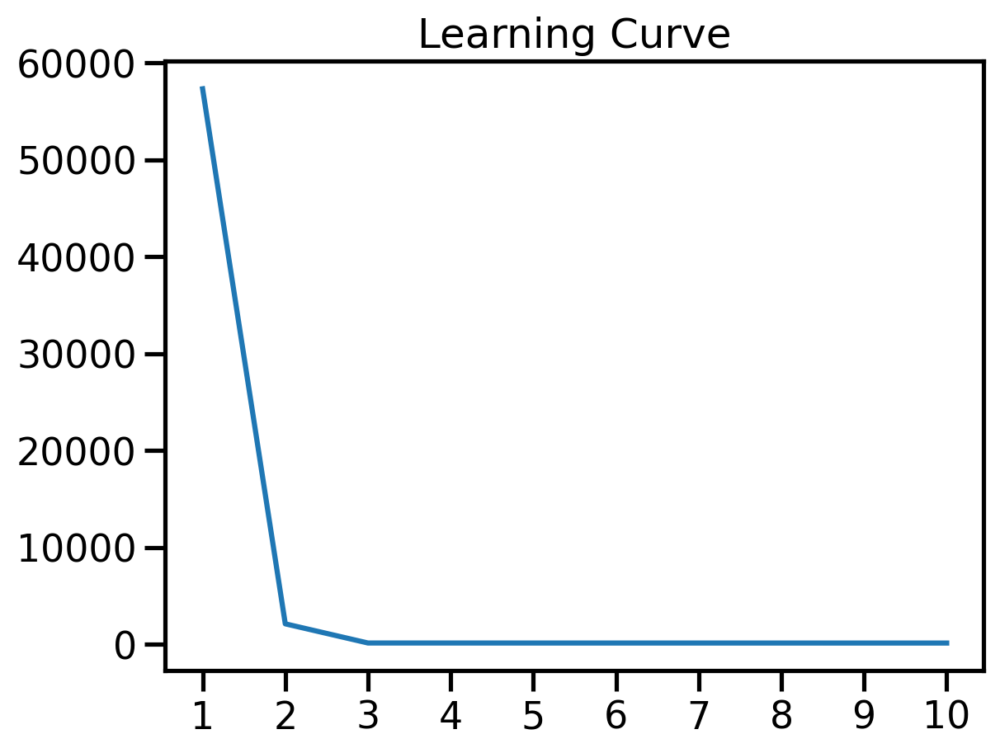

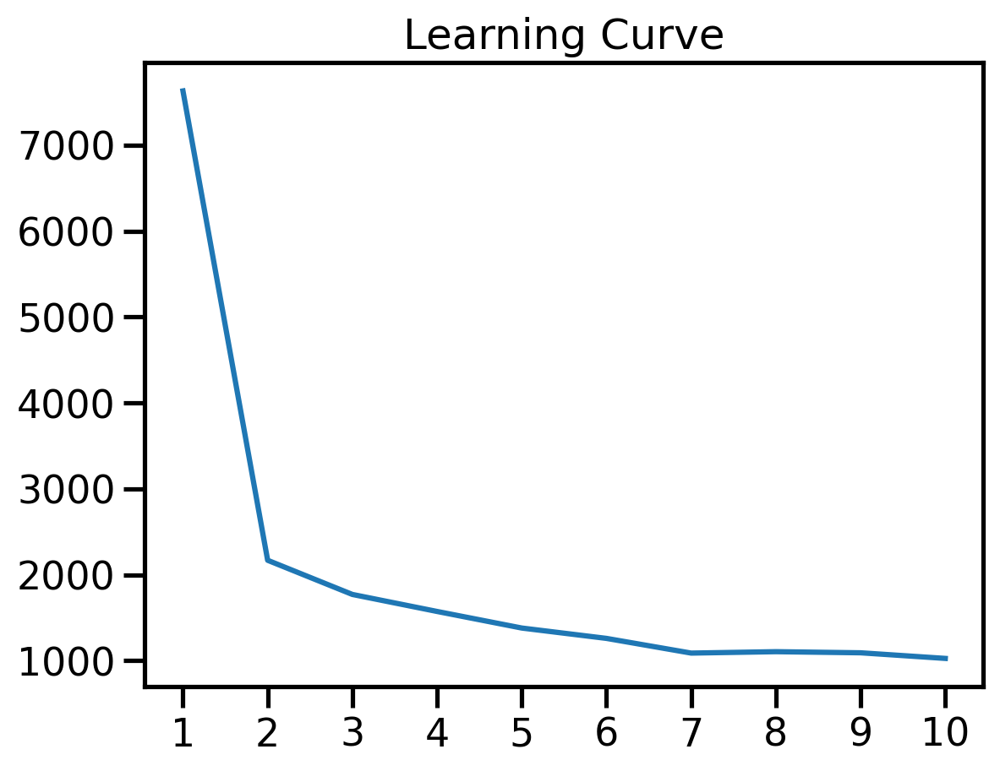

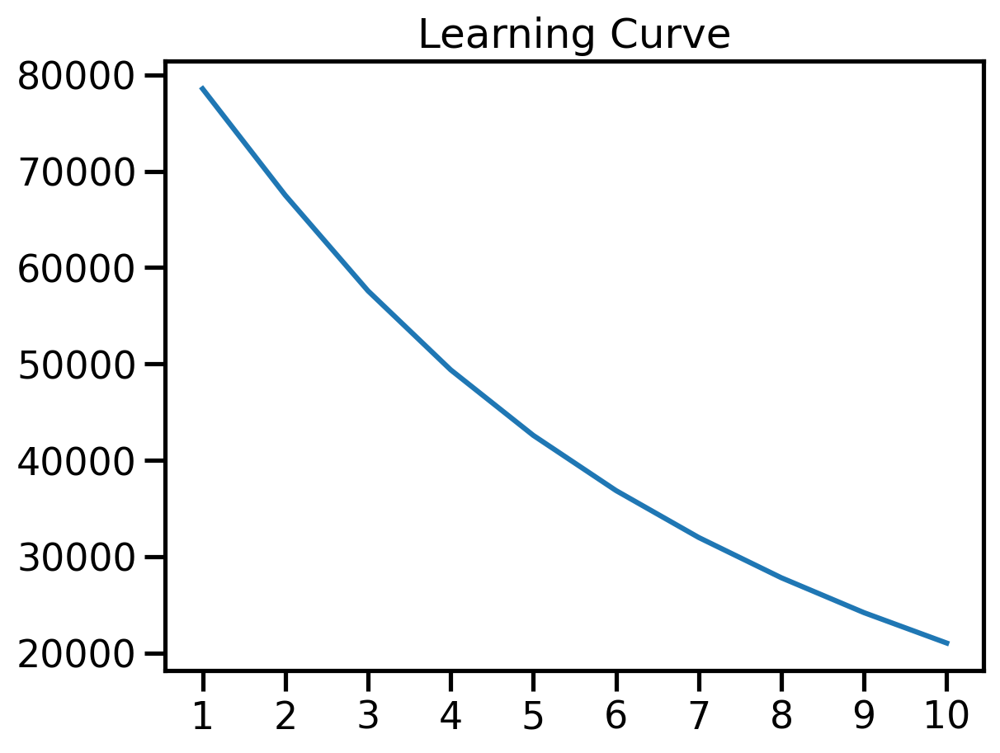

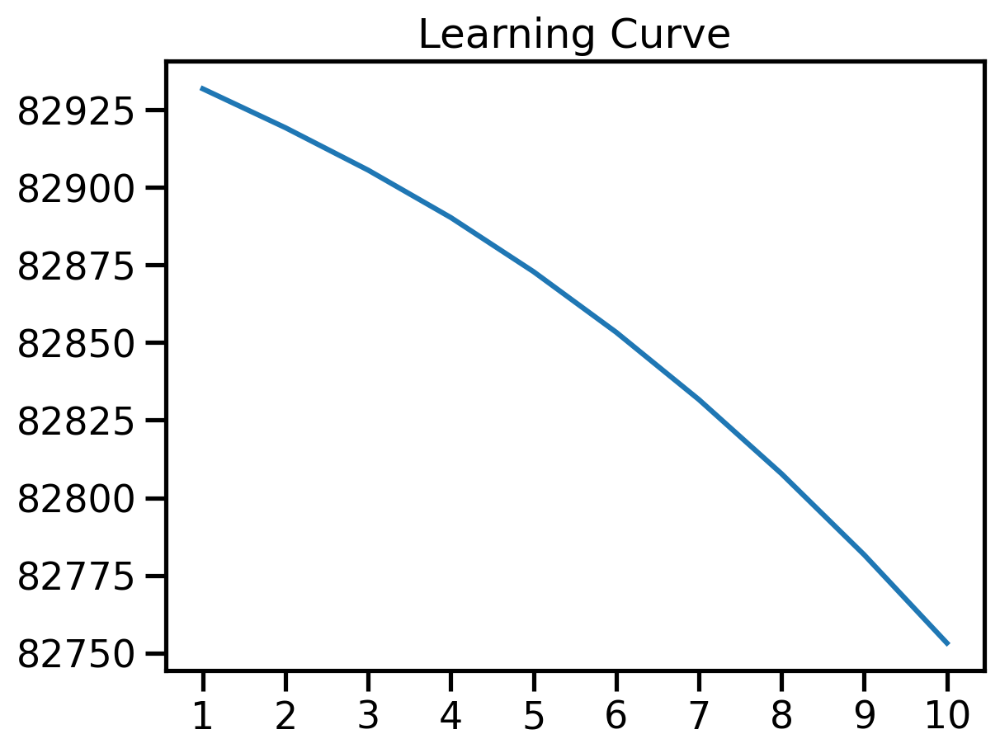

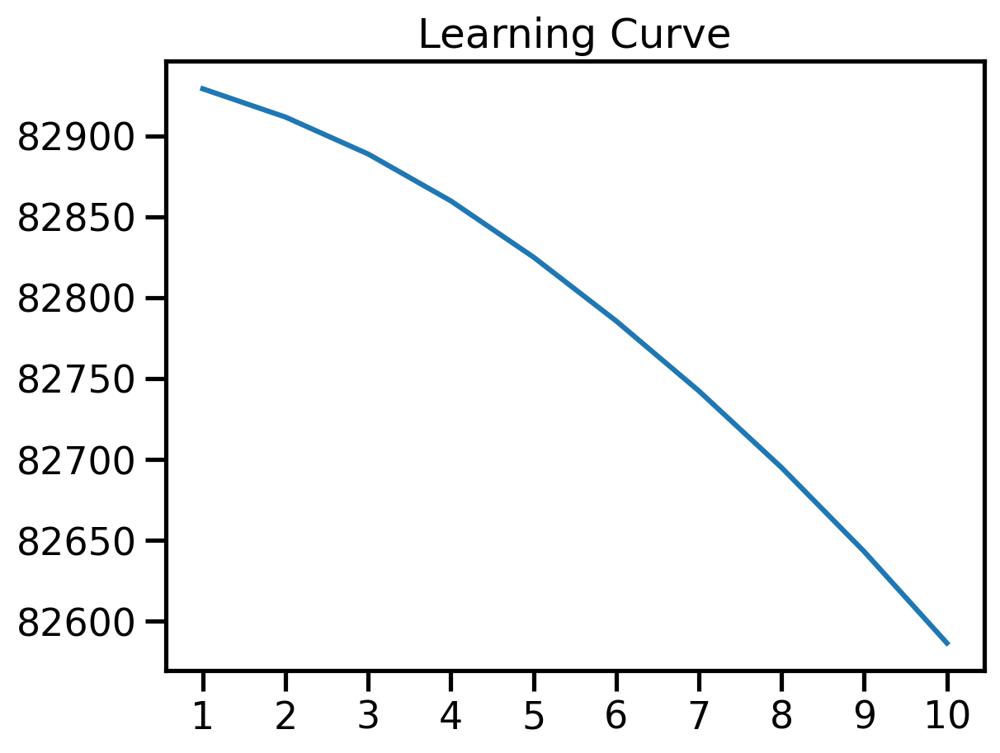

...

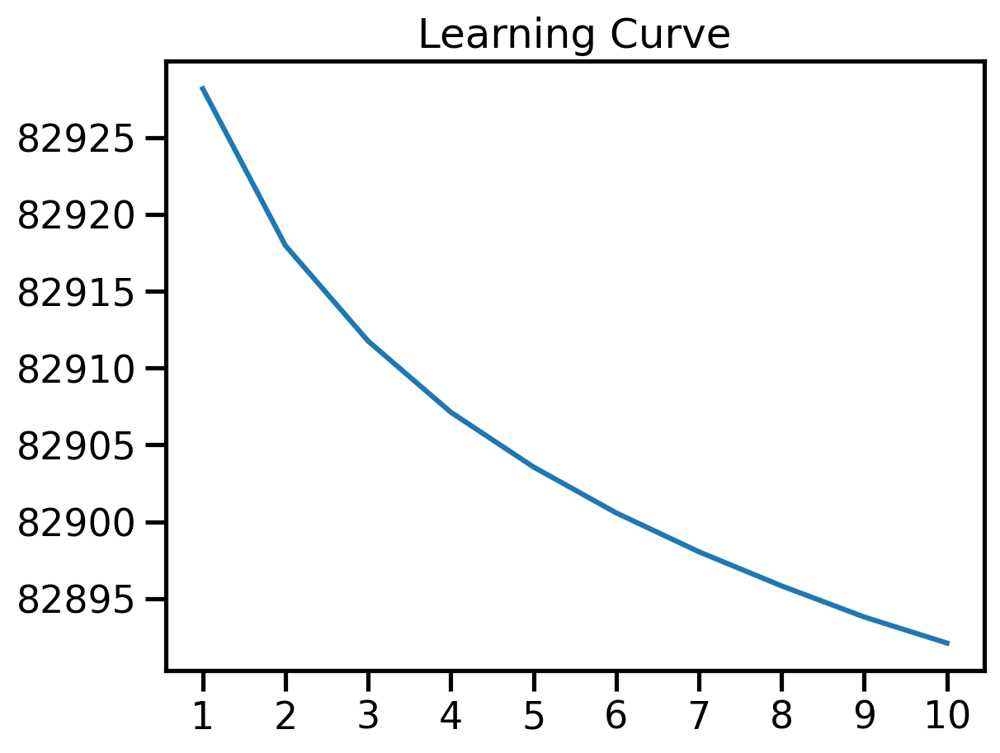

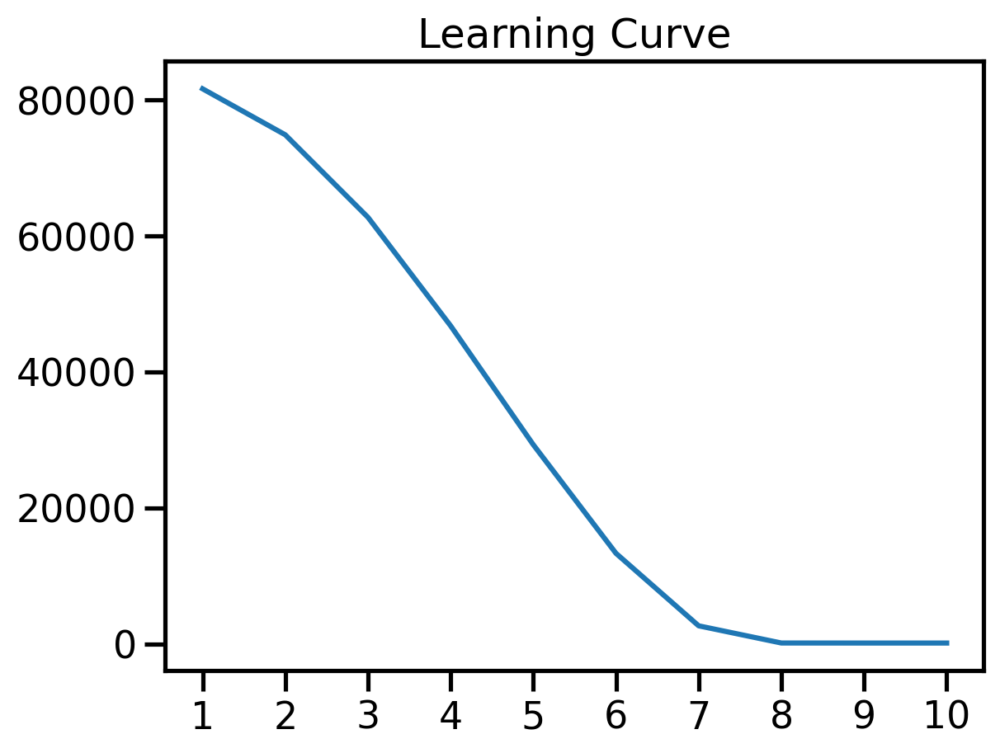

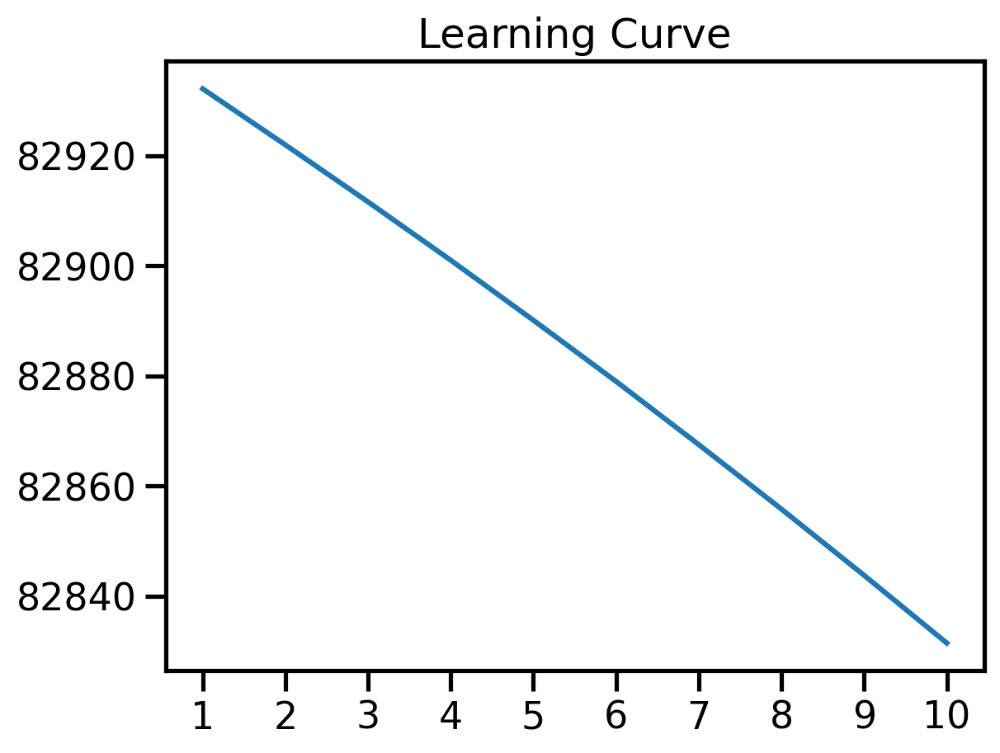

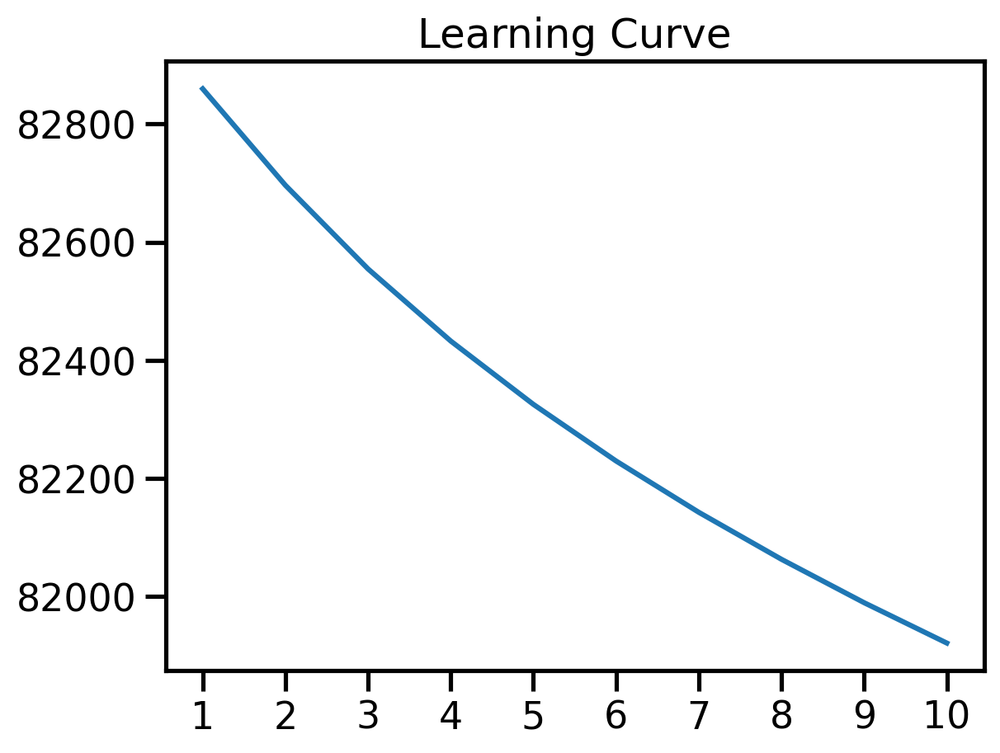

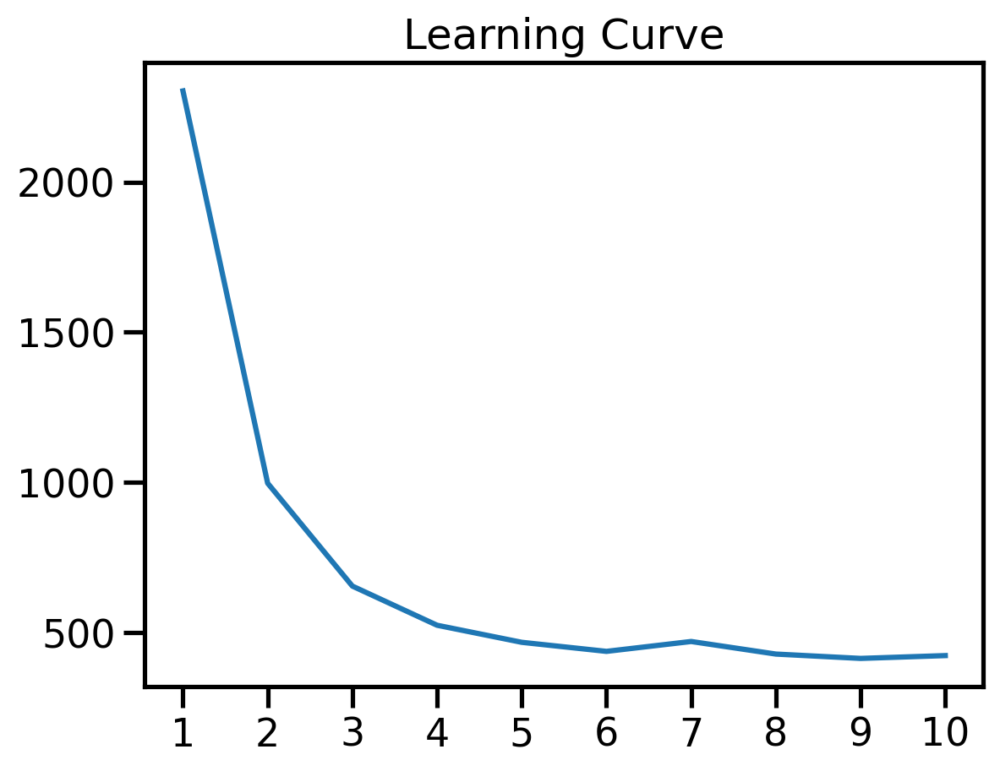

In [347]:
# The fit method returns a history object that
# can be used to plot the learning curve.
def plot_learning_curve(history):
    learning_curve = pd.Series(history.history['loss'])
    learning_curve.index = learning_curve.index + 1

    learning_curve.plot(title='Learning Curve')
    plt.xticks(learning_curve.index)
    plt.show()

for history in historys:
    plot_learning_curve(history)

## Fine tune the model

In [366]:
for k, i in best_run.items():
    print(k, i)

run_id a940ec1ba0ad49c8a900037804b842bf
experiment_id 376968602860947731
status FINISHED
artifact_uri file:///app/mlflow/376968602860947731/a940ec1ba0ad49c8a900037804b842bf/artifacts
start_time 2023-10-23 02:46:26.606000+00:00
end_time 2023-10-23 02:46:42.607000+00:00
metrics.val_mean_absolute_error 4.380666255950928
metrics.lr 0.4917065501213074
metrics.mean_error 0.8077403903007507
metrics.loss 83.59603118896484
metrics.val_r2_score 0.21050260961055756
metrics.val_mean_error 2.2702465057373047
metrics.mean_absolute_error 7.120502948760986
metrics.r2_score -1.7107734680175781
metrics.val_loss 30.046844482421875
params.use_multiprocessing False
params.learning_rate_log -0.3082940187508436
params.opt_decay 0.004
params.baseline None
params.monitor loss
params.opt_learning_rate 0.4917065360784497
params.width_decay 0.7754606523654568
params.validation_split 0.0
params.dropout_rate 0.12528487822244672
params.opt_momentum 0.0
params.layer_index 2
params.batch_size 100
params.opt_clipnorm 4

In [348]:
# Note that Keras evaluates metrics in batches,
# which is okay for averaging-stable metrics like ME, MSE, and MAE,
# but R2 requires full dataset to evaluate precisely.

# This implies two things:
# 1) R2 as reported during training is not precise
# 2) when evaluating R2 after training, batch size must match dataset size

def get_rnn_metrics(model):
    nd_array_by_segment = {
        'train': (train_X_nd, train_y_nd),
        'validate': (validate_X_nd, validate_y_nd),
        'test': (test_X_nd, test_y_nd)
    }

    metrics_by_segment = {
        segment: model.evaluate(
            X_nd, 
            y_nd, 
            verbose=0, 
            batch_size=X_nd.shape[0]
        )
        for segment, (X_nd, y_nd) in nd_array_by_segment.items()
    }

    rnn_metrics = pd.concat([
        pd.DataFrame(
            data=[metrics], 
            columns=['MSE', 'MAE', 'ME', 'R2'], 
            index=[segment]
        )
        for segment, metrics in metrics_by_segment.items()
    ])

    rnn_metrics = pd.DataFrame([rnn_metrics.unstack()], index=['rnn'])\
        .swaplevel(axis=1, i=0, j=1)\
        .reindex(nd_array_by_segment.keys(), axis=1, level=0)\
        .round(2)

    return rnn_metrics

rnn_metrics = get_rnn_metrics(model)
rnn_metrics

train                   validate                     test              \
       MSE   MAE    ME    R2      MSE   MAE    ME    R2    MSE   MAE    ME   
rnn  22.15  3.68  0.38  0.84    30.05  4.38  2.25  0.66  19.62  3.53 -0.53   

           
       R2  
rnn  0.73

In [378]:
model.compile(
        optimizer=optimizers.Adam(learning_rate=0.0001),
        loss='mean_squared_error',
        metrics=[
            'mean_absolute_error',
            mean_error,
            r2_score,
        ]
    )

In [388]:
history = model.fit(
    train_X_nd,
    train_y_nd,
    validation_data=(validate_X_nd, validate_y_nd),
    epochs=20,
    batch_size=700,
    callbacks=[
        TerminateOnNaN(),
        ReduceLROnPlateau(
            monitor='loss',
            min_delta=0.1,
            patience=5,
            factor=0.1,
            cooldown=10,
            verbose=1
        ),
        EarlyStopping(
            monitor='loss',
            min_delta=0.1,
            patience=10
        )
        
    ],
    shuffle=False
)

Epoch 1/20
50/50 [==============================] - 1s 12ms/step - loss: 57.9796 - mean_absolute_error: 6.4802 - mean_error: 0.0690 - r2_score: -0.0442 - val_loss: 17.8477 - val_mean_absolute_error: 3.1320 - val_mean_error: 0.2075 - val_r2_score: 0.6952 - lr: 1.0000e-06
Epoch 2/20
50/50 [==============================] - 0s 8ms/step - loss: 57.9785 - mean_absolute_error: 6.4801 - mean_error: 0.0686 - r2_score: -0.0442 - val_loss: 17.7867 - val_mean_absolute_error: 3.1267 - val_mean_error: 0.2729 - val_r2_score: 0.6957 - lr: 1.0000e-06
Epoch 3/20
50/50 [==============================] - 0s 7ms/step - loss: 57.9782 - mean_absolute_error: 6.4801 - mean_error: 0.0684 - r2_score: -0.0442 - val_loss: 17.7595 - val_mean_absolute_error: 3.1247 - val_mean_error: 0.3113 - val_r2_score: 0.6958 - lr: 1.0000e-06
Epoch 4/20
50/50 [==============================] - 1s 10ms/step - loss: 57.9779 - mean_absolute_error: 6.4801 - mean_error: 0.0681 - r2_score: -0.0442 - val_loss: 17.7463 - val_mean_absolu

In [389]:
rnn_metrics = get_rnn_metrics(model)
rnn_metrics

train                   validate                    test              \
       MSE   MAE    ME    R2      MSE   MAE    ME   R2    MSE   MAE    ME   
rnn  10.32  2.34  0.08  0.93    17.73  3.12  0.24  0.8  12.16  2.62 -0.42   

           
       R2  
rnn  0.84

In [351]:
len(history.history['loss'])

16

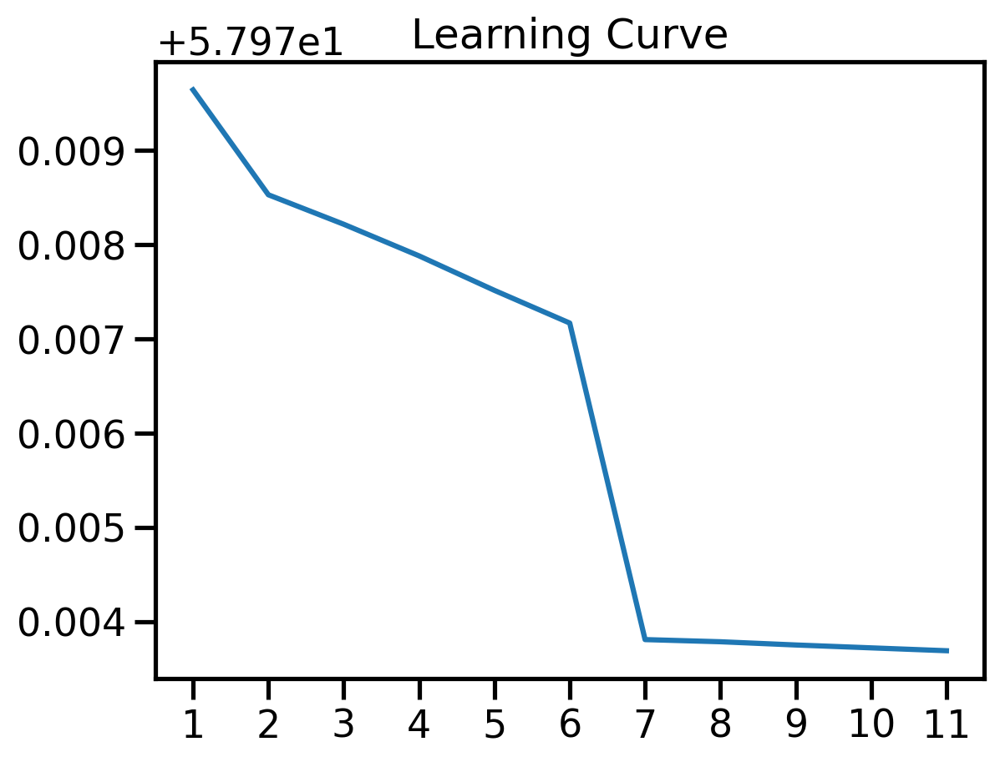

In [390]:
plot_learning_curve(history)

In [143]:
from utils import SegmentDataset, baseline_metrics

segment_names = ['train', 'validate', 'test']
panel_dataset = SegmentDataset.from_pq_workdir(prefix, segment_names, ['x', 'y'])
baseline_metrics = baseline_metrics(panel_dataset)

In [144]:
pd.concat([
    baseline_metrics,
    rnn_metrics
], axis=0).loc[:, [('train', 'MSE'), ('train', 'R2'), ('validate', 'MSE'), ('validate', 'R2'),
                  ('test', 'MSE'), ('test', 'R2')]].round(2)

train       validate         test      
              MSE    R2      MSE    R2    MSE    R2
mean        26.77  0.80    37.23  0.58  28.52  0.61
constant    21.82  0.84    40.25  0.54  20.20  0.72
regression  30.53  0.78    29.94  0.66  33.64  0.54
rnn         22.39  0.84    27.77  0.69  33.39  0.55

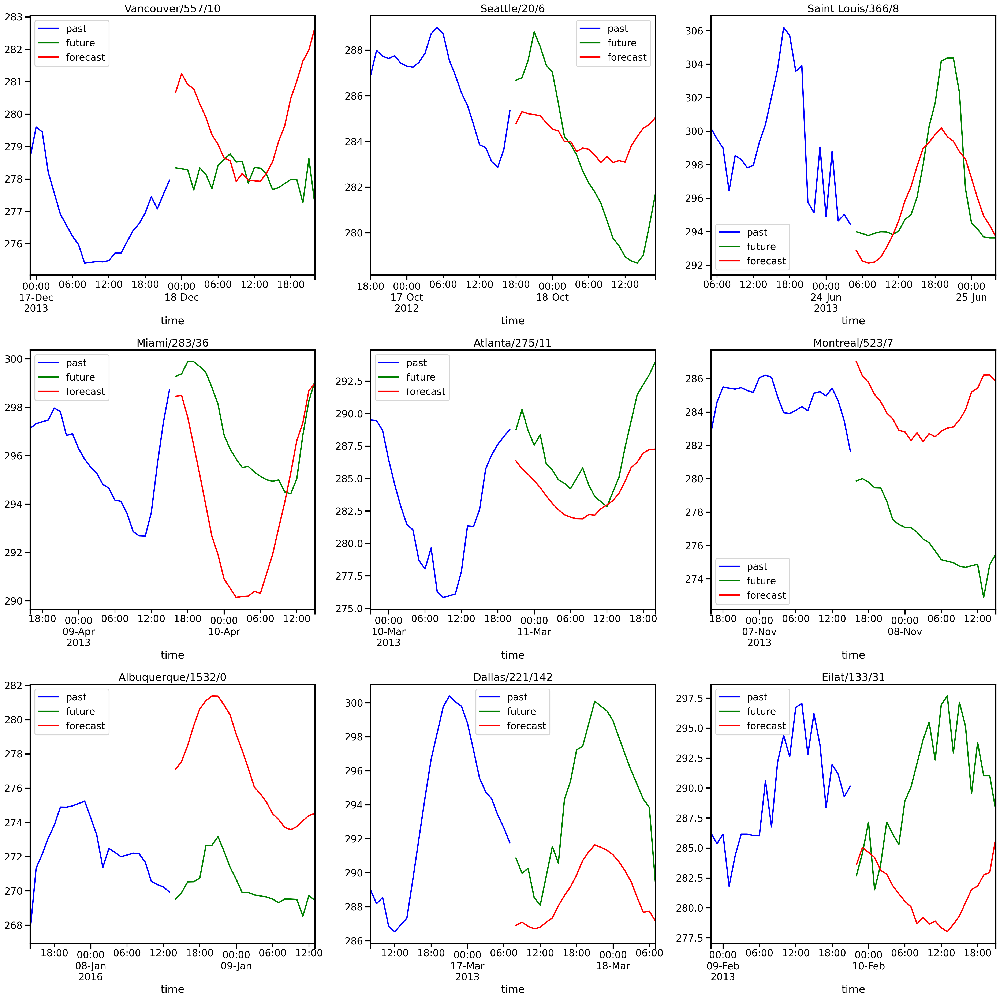

In [201]:
from utils import nd_target_like_panel, plot_random_forecasts

train_y_hat = nd_target_like_panel(train_y, model.predict(train_X_nd))

plot_random_forecasts(
    train_X['temperature'],
    train_y['temperature'],
    train_y_hat.rename(columns={'temperature': 'forecast'})
)

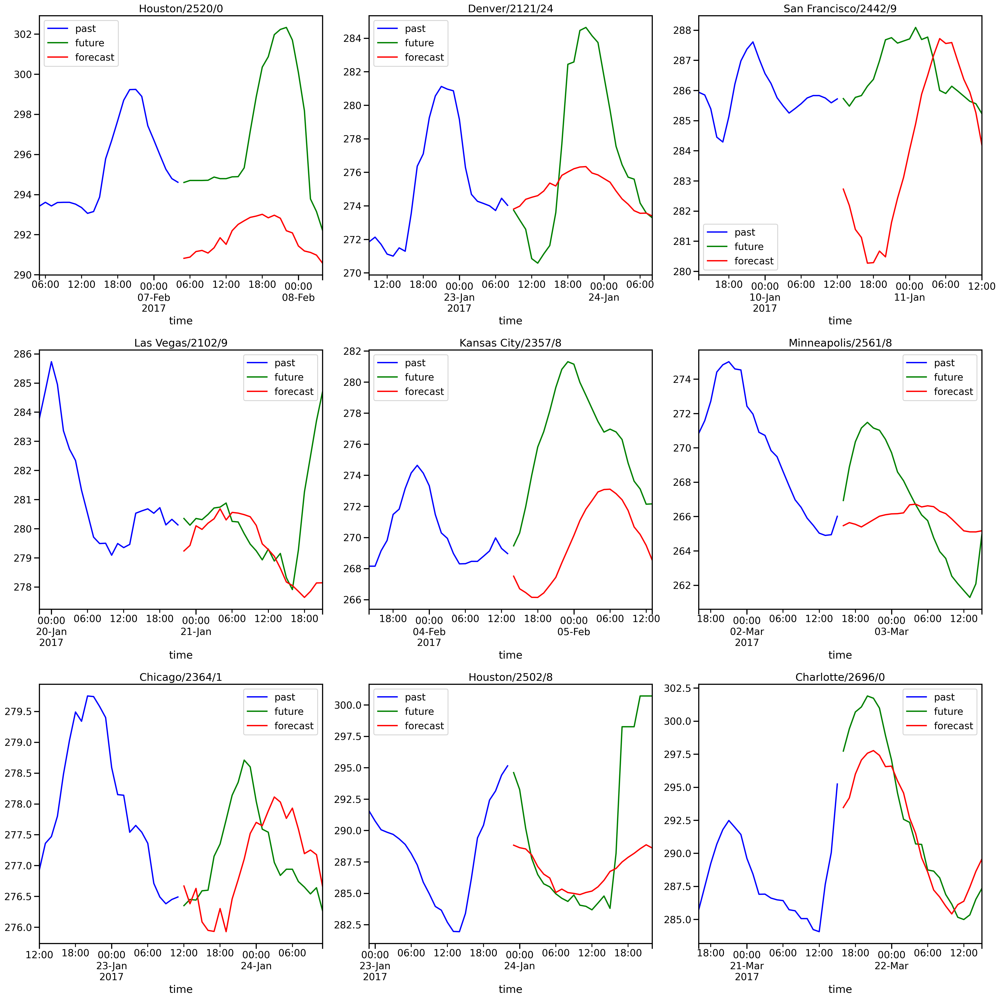

In [393]:
validate_y_hat = nd_target_like_panel(validate_y, model.predict(validate_X_nd))

plot_random_forecasts(
    validate_X['temperature'],
    validate_y['temperature'],
    validate_y_hat.rename(columns={'temperature': 'forecast'})
)

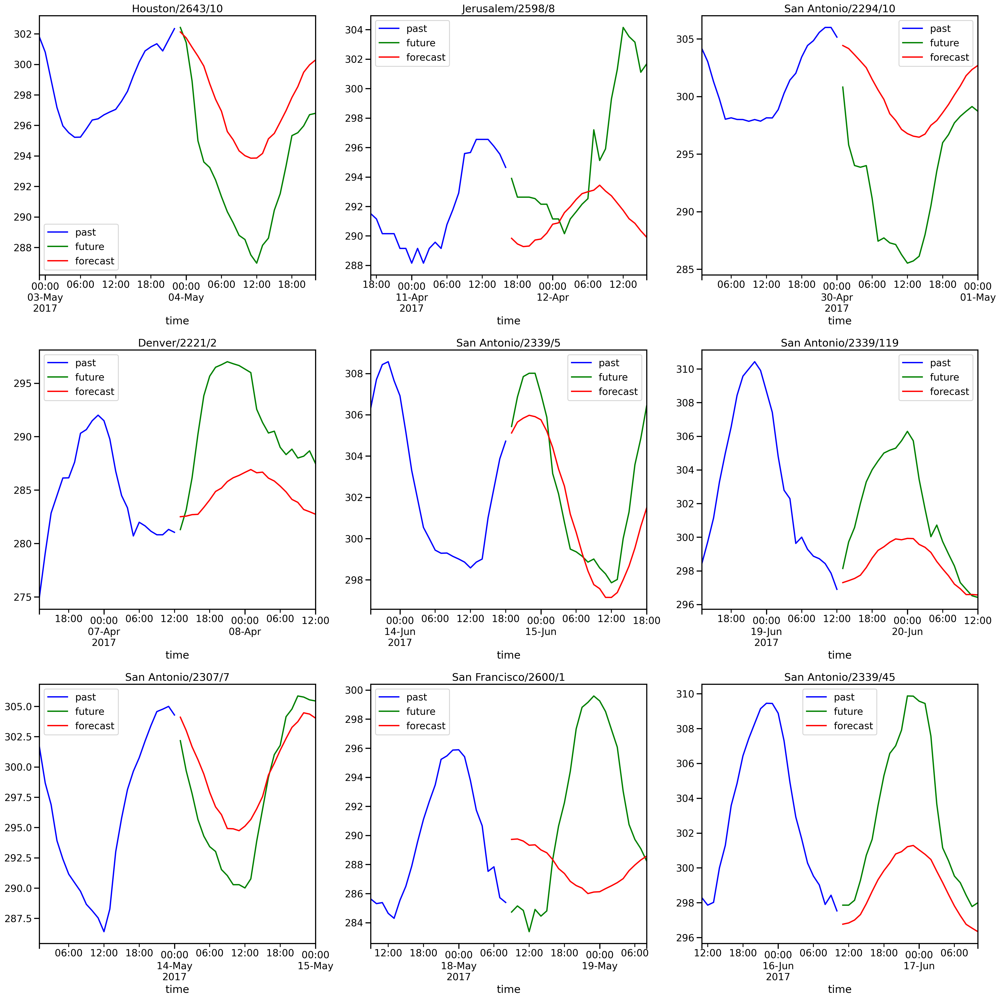

In [383]:
test_y_hat = nd_target_like_panel(test_y, model.predict(test_X_nd))

plot_random_forecasts(
    test_X['temperature'],
    test_y['temperature'],
    test_y_hat.rename(columns={'temperature': 'forecast'})
)

## Save predictions

In [391]:
# TODO: save your predictions on the Score segment as a Pandas data frame
# into a variable named score_y_hat.
score_y_pred = model.predict(score_X_nd)
score_y_pred = score_y_pred.reshape(score_y_pred.shape[0] * score_y_pred.shape[1], 1)

In [392]:
score_y_pred.shape

(57576, 1)

In [393]:
score_y_hat = pd.DataFrame(score_y_pred)
score_y_hat.columns = ['temperature']

# Keras model will output an array of shape (2399, 24) for the Score segment,
# however the expected shape of the submitted data frame is (57576, 1).
# 57576 = 2399 (count of samples in Score segment) x 24 (prediction window).
# Use NumPy's reshape() or ravel() functions to achieve this.

# Finally, the data frame needs to have string column names in order to be saved
# as a Parquet file. If you convert a NumPy array to Pandas data frame,
# column names will be integers, but you can replace the columns names.
# There was a similar example of this in the notebook from the first assignment.

# Expected output: (Index(['temperature'], dtype='object'), (57576, 1))
score_y_hat.columns, score_y_hat.shape

(Index(['temperature'], dtype='object'), (57576, 1))

In [394]:
# Once you are satisfied with your model,
# your need to submit 4 files:
# 1. this notebook and/or any other Python scripts
# 2. Model definition in JSON format
# 3. Model parameters in H5 format
# 4. temperature forecast for the Score segment

import os
model_dir = 'weathernet_model'
os.makedirs(model_dir, exist_ok=True)

# Save model definition:
import json
with open(f'{model_dir}/keras_model.json', 'w') as f:
    model_json = json.dumps(json.loads(model.to_json()), indent=True)
    f.write(model_json)

# Save the learned parameters.
model.save_weights(f"{model_dir}/keras_parameters.h5")

# Finally, let's save the forecast.
score_y_hat.to_parquet(f'{model_dir}/score_y_hat.parquet')

In [ ]:


# IMPORTANT: In order to pass the assignment, you need
# to improve the architecture and/or training procedure of this model.
# You CAN NOT submit the model as is. Please add plain English Python
# comments on how you modified the model and/or training procedure.

# model.compile(
#     optimizer=Adam(learning_rate=0.01, clipnorm=0.1),
#     loss='mean_squared_error',
#     metrics=[
#         'mean_absolute_error',
#         mean_error,
#         r2_score,
#     ]
# )

In [ ]:
# %%time

# from tensorflow.keras.callbacks import TerminateOnNaN, ReduceLROnPlateau, EarlyStopping

# IMPORTANT: In order to pass the assignment, you need
# to improve the architecture and/or training procedure of this model.
# You CAN NOT submit the model as is. Please add plain English Python
# comments on how you modified the model and/or training procedure.

# history = model.fit(
#     train_X_nd,
#     train_y_nd,
#     validation_data=(validate_X_nd, validate_y_nd),
#     epochs=3,
#     batch_size=100,
#     callbacks=[
#         TerminateOnNaN(),
#         ReduceLROnPlateau(
#             monitor='loss',
#             min_delta=0.1,
#             patience=5,
#             factor=0.1,
#             cooldown=10,
#             verbose=1
#         ),
#         EarlyStopping(
#             monitor='loss',
#             min_delta=0.1,
#             patience=10
#         )
#     ]
# )